In [17]:
# Import required libraries
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from model import DenseNet121, CLASS_NAMES
# encoding: utf-8

"""
Fixed Evaluation Code for CheXNet
"""

import os
import numpy as np
import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.models import densenet121
from sklearn.metrics import roc_auc_score
from read_data import ChestXrayDataSet
from tqdm import tqdm  # For progress tracking
# Importing the model and class names from model.py


In [2]:
import sys
print(sys.executable)

# Path to the model checkpoint

C:\Users\zafer\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe


In [3]:
# Grad-CAM implementation
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None

        # Hooks to save activations and gradients
        target_layer.register_forward_hook(self.save_activation)
        target_layer.register_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activation = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate_heatmap(self, class_idx):
    # Compute the weights
        weights = self.gradients.mean(dim=[0, 2, 3]).to(self.activation.device)  # Ensure weights are on the same device as activation
        activation = self.activation.squeeze(0).detach()

    # Initialize the heatmap on the correct device
        heatmap = torch.zeros(activation.shape[1:], device=activation.device)

    # Compute the weighted sum of activations
        for i, w in enumerate(weights):
            heatmap += w * activation[i]

    # Apply ReLU to remove negative values
        heatmap = torch.clamp(heatmap, min=0)
        return heatmap.cpu().numpy()  # Move to CPU for visualization


In [4]:
 # Path to the pre-trained model checkpoint
N_CLASSES = len(CLASS_NAMES)  # Number of classes

CKPT_PATH = "arnoweng-model.pth.tar"  # Path to the model checkpoint
# Initialize the model
model = DenseNet121(N_CLASSES).cuda()

# Load the checkpoint
checkpoint = torch.load(CKPT_PATH)

# Adjust state_dict to fix keys
state_dict = checkpoint["state_dict"]
new_state_dict = {}
for k, v in state_dict.items():
    # Remove 'module.' prefix if present
    new_key = k.replace("module.", "")
    # Replace 'norm.1' with 'norm1', 'conv.1' with 'conv1', etc.
    new_key = new_key.replace(".1", "1").replace(".2", "2").replace(".3", "3")
    new_state_dict[new_key] = v

# Load the adjusted state_dict
model.load_state_dict(new_state_dict)

# Set model to evaluation mode
model.eval()

print("Model loaded successfully with adjusted state_dict!")


C:\Users\zafer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\zafer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\zafer\AppData\Local\Temp\ipykernel_20580\368776349.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses

Model loaded successfully with adjusted state_dict!


In [5]:
# Identify the target layer for Grad-CAM
target_layer = model.densenet121.features[-1]  # Last convolutional layer of DenseNet121
grad_cam = GradCAM(model, target_layer)


In [6]:
import os
import random

# Paths
test_list_path = "ChestX-ray14/labels/test_list.txt"
image_dir = "C:/Users/zafer/OneDrive/Masaüstü/Dev/cnn-in-nih14-old/dataset/images-1024/images-1024"

# Load test_list.txt and pick a random image
with open(test_list_path, "r") as f:
    lines = f.readlines()

# Extract image IDs
image_ids = [line.split()[0] for line in lines]
random_image_id = random.choice(image_ids)

# Full image path
random_image_path = os.path.join(image_dir, random_image_id)

print(f"Selected random image: {random_image_path}")

# Load test_list.txt and find the labels for the selected image
with open(test_list_path, "r") as f:
    lines = f.readlines()

# Find the corresponding line for the selected image
selected_line = next(line for line in lines if random_image_id in line)

# Extract binary labels for the diseases
binary_labels = list(map(int, selected_line.split()[1:]))

# Map binary labels to disease names
detected_diseases = [CLASS_NAMES[i] for i, label in enumerate(binary_labels) if label == 1]

print(f"Detected diseases for the image '{random_image_id}': {detected_diseases}")


Selected random image: C:/Users/zafer/OneDrive/Masaüstü/Dev/cnn-in-nih14-old/dataset/images-1024/images-1024\00007402_001.png
Detected diseases for the image '00007402_001.png': ['Pneumothorax']


In [7]:
# Define the transformation pipeline
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to 224x224
    transforms.ToTensor(),          # Convert image to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Load and preprocess the image

img = Image.open(random_image_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0).cuda()  # Add batch dimension and move to GPU


In [8]:
# Perform forward pass
output = model(input_tensor)

# Select a target class for visualization
target_class = 1  #[ 'Atelectasis', 'Cardiomegaly', 'Effusion', 'Infiltration', 'Mass', 'Nodule', 'Pneumonia',
                  #"Pneumothorax', 'Consolidation', 'Edema', 'Emphysema', 'Fibrosis', 'Pleural_Thickening', 'Hernia']
                  
model.zero_grad()  # Clear gradients

output[0, target_class].backward()  # Perform backward pass for the target class


C:\Users\zafer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\modules\module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


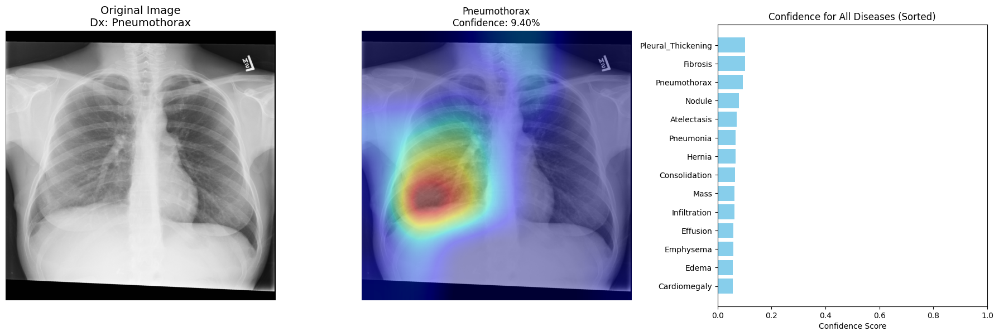

In [9]:
# Generate Grad-CAM visualizations for each detected disease
if detected_diseases:
    # Get raw model output (logits) and apply softmax only for confidence scores
    logits = model(input_tensor)  # Raw output from the model
    confidence_scores = logits.softmax(dim=1).detach().cpu().numpy().flatten()

    # Sort diseases and scores for the bar chart (high to low)
    sorted_indices = confidence_scores.argsort()[::-1]  # Sort in descending order
    sorted_scores = confidence_scores[sorted_indices]
    sorted_diseases = [CLASS_NAMES[i] for i in sorted_indices]

    # Create subplots in a single row + 1 for the bar chart
    fig, axes = plt.subplots(1, len(detected_diseases) + 2, figsize=(6 * (len(detected_diseases) + 2), 6))

    # Plot the original image in the first column with detected illnesses in header
    detected_text = ", ".join(detected_diseases)
    axes[0].imshow(img)
    axes[0].set_title(f"Original Image\nDx: {detected_text}", fontsize=14)
    axes[0].axis("off")

    # Grad-CAM overlays for each detected disease
    for idx, disease in enumerate(detected_diseases):
        target_class = CLASS_NAMES.index(disease)

        # Recalculate Grad-CAM for the specific target class
        model.zero_grad()  # Clear existing gradients
        logits[0, target_class].backward(retain_graph=True)  # Retain the computational graph
        heatmap = grad_cam.generate_heatmap(target_class)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= heatmap.max()

        # Resize and blend heatmap
        heatmap_resized = Image.fromarray((heatmap * 255).astype(np.uint8)).resize(img.size, Image.BICUBIC)
        heatmap_array = np.array(heatmap_resized)
        heatmap_overlay = np.array(img).astype(np.float32)
        heatmap_overlay = (heatmap_overlay * 0.6 + plt.cm.jet(heatmap_array / 255.0)[:, :, :3] * 255 * 0.4).astype(np.uint8)

        # Plot Grad-CAM overlay with confidence percentage
        axes[idx + 1].imshow(heatmap_overlay)
        axes[idx + 1].set_title(f"{disease}\nConfidence: {confidence_scores[target_class]:.2%}")
        axes[idx + 1].axis("off")

    # Add bar chart of sorted confidence scores for all 14 diseases
    axes[-1].barh(sorted_diseases, sorted_scores, color="skyblue")
    axes[-1].set_xlim(0, 1)
    axes[-1].set_xlabel("Confidence Score")
    axes[-1].set_title("Confidence for All Diseases (Sorted)")
    axes[-1].invert_yaxis()  # Flip to display highest confidence at the top

    plt.tight_layout()
    plt.show()
else:
    print(f"No detected diseases for the image '{random_image_id}'.")


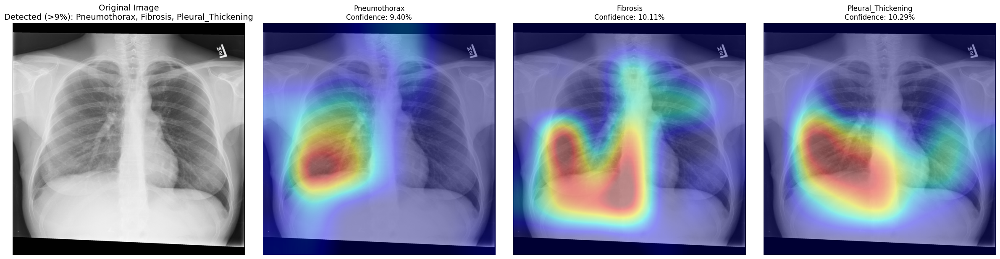

In [10]:
# Generate Grad-CAM visualizations for detected diseases with confidence > 12%
THRESHOLD = 0.09  # Confidence threshold (12%)

if detected_diseases:
    # Get raw model output (logits) and apply softmax for confidence scores
    logits = model(input_tensor)  # Raw output from the model
    confidence_scores = logits.softmax(dim=1).detach().cpu().numpy().flatten()

    # Filter diseases based on confidence threshold
    high_confidence_indices = [i for i in range(len(CLASS_NAMES)) if confidence_scores[i] > THRESHOLD]
    high_confidence_scores = [confidence_scores[i] for i in high_confidence_indices]
    high_confidence_diseases = [CLASS_NAMES[i] for i in high_confidence_indices]

    if high_confidence_diseases:
        # Create subplots for the original image and filtered Grad-CAM overlays
        fig, axes = plt.subplots(1, len(high_confidence_diseases) + 1, figsize=(6 * (len(high_confidence_diseases) + 1), 6))

        # Plot the original image in the first column with detected illnesses in header
        detected_text = ", ".join(high_confidence_diseases)
        axes[0].imshow(img)
        axes[0].set_title(f"Original Image\nDetected (>{THRESHOLD*100:.0f}%): {detected_text}", fontsize=14)
        axes[0].axis("off")

        # Grad-CAM overlays for each high-confidence disease
        for idx, disease in enumerate(high_confidence_diseases):
            target_class = CLASS_NAMES.index(disease)

            # Recalculate Grad-CAM for the specific target class
            model.zero_grad()  # Clear existing gradients
            logits[0, target_class].backward(retain_graph=True)  # Retain the computational graph
            heatmap = grad_cam.generate_heatmap(target_class)
            heatmap = np.maximum(heatmap, 0)
            heatmap /= heatmap.max()

            # Resize and blend heatmap
            heatmap_resized = Image.fromarray((heatmap * 255).astype(np.uint8)).resize(img.size, Image.BICUBIC)
            heatmap_array = np.array(heatmap_resized)
            heatmap_overlay = np.array(img).astype(np.float32)
            heatmap_overlay = (heatmap_overlay * 0.6 + plt.cm.jet(heatmap_array / 255.0)[:, :, :3] * 255 * 0.4).astype(np.uint8)

            # Plot Grad-CAM overlay with confidence percentage
            axes[idx + 1].imshow(heatmap_overlay)
            axes[idx + 1].set_title(f"{disease}\nConfidence: {high_confidence_scores[idx]:.2%}")
            axes[idx + 1].axis("off")

        plt.tight_layout()
        plt.show()
    else:
        print(f"No diseases detected with confidence > {THRESHOLD*100:.0f}% for the image '{random_image_id}'.")
else:
    print(f"No detected diseases for the image '{random_image_id}'.")


In [11]:

N_CLASSES = 14
CLASS_NAMES = [
    'Atelectasis', 'Cardiomegaly', 'Effusion', 'Infiltration', 'Mass',
    'Nodule', 'Pneumonia', 'Pneumothorax', 'Consolidation', 'Edema',
    'Emphysema', 'Fibrosis', 'Pleural_Thickening', 'Hernia'
]
DATA_DIR = r"C:/Users/zafer/OneDrive/Masaüstü/224NIH/dataset/images-224/images-224"
TEST_IMAGE_LIST = 'ChestX-ray14/labels/test_list.txt'
BATCH_SIZE = 16


def tensor_transform(crops):
    return torch.stack([transforms.ToTensor()(crop) for crop in crops])


def normalize_transform(crops):
    return torch.stack([transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(crop) for crop in crops])


def create_transforms():
    """Create transformations for preprocessing."""
    return transforms.Compose([
        transforms.Resize(256),
        transforms.TenCrop(224),
        transforms.Lambda(tensor_transform),
        transforms.Lambda(normalize_transform)
    ])


In [12]:
class DenseNet121(nn.Module):
    """DenseNet121 model for multi-label classification."""
    def __init__(self, out_size):
        super(DenseNet121, self).__init__()
        self.densenet121 = densenet121(pretrained=False)
        num_ftrs = self.densenet121.classifier.in_features
        self.densenet121.classifier = nn.Linear(num_ftrs, out_size)

    def forward(self, x):
        return self.densenet121(x)  # Raw logits output


In [22]:
def load_model():
    """Initialize and load the trained DenseNet121 model."""
    model = DenseNet121(N_CLASSES)
    if os.path.isfile(CKPT_PATH):
        print("=> Loading checkpoint")
        checkpoint = torch.load(CKPT_PATH, map_location="cuda:0")

        if 'state_dict' in checkpoint:
            state_dict = checkpoint['state_dict']
            # Remove 'module.' prefix if saved with DataParallel
            state_dict = {k.replace('module.', '')
                          .replace("norm.1","norm1")
                          .replace("conv.1","conv1")
                          .replace("norm.2","norm2")
                          .replace("conv.2","conv2")
                          : v for k, v in state_dict.items()}
            model.load_state_dict(state_dict)
        else:
            model.load_state_dict(checkpoint)

        print("=> Checkpoint loaded")
    else:
        print("=> No checkpoint found at the specified path")

    return model


In [24]:
# Global variables for reuse
gt_global = None
pred_global = None

def evaluate_model(model, test_loader):
    """Evaluate the model and compute AUROC."""
    global gt_global, pred_global  # Declare global variables
    model.eval()  # Set the model to evaluation mode
    gt, pred = [], []

    with torch.no_grad():
        for inp, target in tqdm(test_loader, desc="Evaluating", leave=True):
            target = target.cuda()
            bs, n_crops, c, h, w = inp.size()
            inp = inp.view(-1, c, h, w).cuda()

            # Get raw logits and apply sigmoid
            logits = model(inp)
            output_mean = torch.sigmoid(logits.view(bs, n_crops, -1).mean(1))

            gt.append(target.cpu())
            pred.append(output_mean.cpu())

    # Concatenate all batches
    gt_global = torch.cat(gt)
    pred_global = torch.cat(pred)

    # Return AUROC for immediate use
    return compute_AUCs(gt_global, pred_global)


In [26]:
import torch.backends.cudnn as cudnn

def main():
    cudnn.benchmark = True  # Enable optimized GPU performance

    # Load model
    model = load_model()
    model = model.cuda()

    # Prepare data
    transform = create_transforms()
    test_dataset = ChestXrayDataSet(data_dir=DATA_DIR, image_list_file=TEST_IMAGE_LIST, transform=transform)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

    # Evaluate and compute AUROC
    AUROCs = evaluate_model(model, test_loader)
    AUROC_avg = np.mean(AUROCs)

    print(f'The average AUROC is {AUROC_avg:.3f}')
    for i, auroc in enumerate(AUROCs):
        print(f'The AUROC of {CLASS_NAMES[i]} is {auroc:.3f}')

    # gt_global and pred_global can now be used in other analyses


if __name__ == '__main__':
    main()


=> Loading checkpoint


C:\Users\zafer\AppData\Local\Temp\ipykernel_20580\3584149777.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(CKPT_PATH, map_location="cuda:0")


=> Checkpoint loaded


Evaluating: 100%|██████████| 1403/1403 [10:56<00:00,  2.14it/s]

The average AUROC is 0.838
The AUROC of Atelectasis is 0.824
The AUROC of Cardiomegaly is 0.916
The AUROC of Effusion is 0.886
The AUROC of Infiltration is 0.710
The AUROC of Mass is 0.854
The AUROC of Nodule is 0.778
The AUROC of Pneumonia is 0.768
The AUROC of Pneumothorax is 0.864
The AUROC of Consolidation is 0.809
The AUROC of Edema is 0.890
The AUROC of Emphysema is 0.922
The AUROC of Fibrosis is 0.822
The AUROC of Pleural_Thickening is 0.780
The AUROC of Hernia is 0.910


In [48]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def compute_confusion_matrices(gt, pred, threshold=0.5):
    """
    Compute confusion matrices for each class.
    Args:
        gt (torch.Tensor): Ground truth labels (shape: [num_samples, num_classes]).
        pred (torch.Tensor): Predicted probabilities (shape: [num_samples, num_classes]).
        threshold (float): Threshold to convert probabilities to binary predictions.
    Returns:
        List[np.ndarray]: List of confusion matrices for each class.
    """
    # Ensure inputs are NumPy arrays
    gt_np = gt.cpu().numpy() if isinstance(gt, torch.Tensor) else gt
    pred_np = pred.cpu().numpy() if isinstance(pred, torch.Tensor) else pred
    
    # Apply threshold to predictions
    pred_binary = (pred_np > threshold).astype(int)

    confusion_matrices = []
    for i in range(gt_np.shape[1]):  # Iterate over each class
        cm = confusion_matrix(gt_np[:, i], pred_binary[:, i], labels=[0, 1])
        confusion_matrices.append(cm)

    return confusion_matrices


def print_confusion_matrix(cm, class_name):
    """
    Print the confusion matrix for a specific class in a readable format.
    Args:
        cm (np.ndarray): Confusion matrix (shape: [2, 2]).
        class_name (str): Name of the class for the confusion matrix.
    """
    print(f"\nConfusion Matrix for {class_name}:")
    print(f"Actual Negative | Actual Positive")
    print(f"Predicted Negative: {cm[0, 0]}           {cm[1, 0]}")
    print(f"Predicted Positive: {cm[0, 1]}           {cm[1, 1]}")



In [49]:
confusion_matrices = compute_confusion_matrices(gt_global, pred_global)

# Print confusion matrices for each class
for i, cm in enumerate(confusion_matrices):
    print_confusion_matrix(cm, CLASS_NAMES[i])



Confusion Matrix for Atelectasis:
Actual Negative | Actual Positive
Predicted Negative: 0           0
Predicted Positive: 20013           2420

Confusion Matrix for Cardiomegaly:
Actual Negative | Actual Positive
Predicted Negative: 0           0
Predicted Positive: 21851           582

Confusion Matrix for Effusion:
Actual Negative | Actual Positive
Predicted Negative: 0           0
Predicted Positive: 19679           2754

Confusion Matrix for Infiltration:
Actual Negative | Actual Positive
Predicted Negative: 0           0
Predicted Positive: 18495           3938

Confusion Matrix for Mass:
Actual Negative | Actual Positive
Predicted Negative: 0           0
Predicted Positive: 21300           1133

Confusion Matrix for Nodule:
Actual Negative | Actual Positive
Predicted Negative: 0           0
Predicted Positive: 21098           1335

Confusion Matrix for Pneumonia:
Actual Negative | Actual Positive
Predicted Negative: 0           0
Predicted Positive: 22191           242

Confusio

In [41]:
class_idx = 0  # For 'Atelectasis'
gt_np = gt_global.numpy()  # Assuming gt_global is available
class_counts = np.bincount(gt_np[:, class_idx].astype(int))
print(f"Class Distribution for {CLASS_NAMES[class_idx]}: {class_counts}")


Class Distribution for Atelectasis: [20013  2420]


In [42]:
pred_np = pred_global.numpy()
threshold = 0.7  # Adjust as needed
pred_binary = (pred_np[:, class_idx] > threshold).astype(int)
print(f"New Prediction Distribution for {CLASS_NAMES[class_idx]}: {np.bincount(pred_binary)}")



New Prediction Distribution for Atelectasis: [21311  1122]


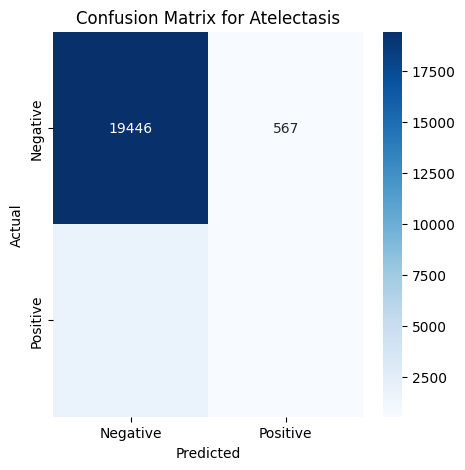

In [43]:
cm = confusion_matrix(gt_np[:, class_idx], pred_binary, labels=[0, 1])
plot_confusion_matrix(cm, CLASS_NAMES[class_idx])


In [50]:
from sklearn.metrics import f1_score

def find_best_thresholds(gt, pred, metric='f1'):
    """
    Find the best threshold for each class to maximize the specified metric.
    Args:
        gt (torch.Tensor or np.ndarray): Ground truth labels (shape: [num_samples, num_classes]).
        pred (torch.Tensor or np.ndarray): Predicted probabilities (shape: [num_samples, num_classes]).
        metric (str): Metric to optimize ('f1', 'accuracy', etc.).
    Returns:
        List[float]: Best threshold for each class.
    """
    gt_np = gt.cpu().numpy() if isinstance(gt, torch.Tensor) else gt
    pred_np = pred.cpu().numpy() if isinstance(pred, torch.Tensor) else pred

    best_thresholds = []
    for i in range(gt_np.shape[1]):  # Iterate over classes
        best_metric = 0
        best_threshold = 0.5
        for t in np.arange(0, 1.01, 0.01):  # Test thresholds from 0 to 1 with a step of 0.01
            pred_binary = (pred_np[:, i] > t).astype(int)
            if metric == 'f1':
                score = f1_score(gt_np[:, i], pred_binary, zero_division=0)
            elif metric == 'youden':
                tn, fp, fn, tp = confusion_matrix(gt_np[:, i], pred_binary, labels=[0, 1]).ravel()
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                score = sensitivity + specificity - 1
            else:
                raise ValueError(f"Unsupported metric: {metric}")

            if score > best_metric:
                best_metric = score
                best_threshold = t
        best_thresholds.append(best_threshold)

    return best_thresholds


In [51]:
# Find best thresholds using F1 score
best_thresholds = find_best_thresholds(gt_global, pred_global, metric='f1')

# Print the best thresholds for each class
for i, threshold in enumerate(best_thresholds):
    print(f"Best Threshold for {CLASS_NAMES[i]}: {threshold:.2f}")


Best Threshold for Atelectasis: 0.66
Best Threshold for Cardiomegaly: 0.71
Best Threshold for Effusion: 0.66
Best Threshold for Infiltration: 0.63
Best Threshold for Mass: 0.70
Best Threshold for Nodule: 0.69
Best Threshold for Pneumonia: 0.69
Best Threshold for Pneumothorax: 0.69
Best Threshold for Consolidation: 0.67
Best Threshold for Edema: 0.70
Best Threshold for Emphysema: 0.71
Best Threshold for Fibrosis: 0.72
Best Threshold for Pleural_Thickening: 0.69
Best Threshold for Hernia: 0.71


In [52]:
def compute_confusion_matrices_with_thresholds(gt, pred, thresholds):
    """
    Compute confusion matrices for each class using specific thresholds.
    Args:
        gt (torch.Tensor or np.ndarray): Ground truth labels (shape: [num_samples, num_classes]).
        pred (torch.Tensor or np.ndarray): Predicted probabilities (shape: [num_samples, num_classes]).
        thresholds (List[float]): List of thresholds for each class.
    Returns:
        List[np.ndarray]: List of confusion matrices for each class.
    """
    gt_np = gt.cpu().numpy() if isinstance(gt, torch.Tensor) else gt
    pred_np = pred.cpu().numpy() if isinstance(pred, torch.Tensor) else pred

    confusion_matrices = []
    for i in range(gt_np.shape[1]):  # Iterate over classes
        pred_binary = (pred_np[:, i] > thresholds[i]).astype(int)
        cm = confusion_matrix(gt_np[:, i], pred_binary, labels=[0, 1])
        confusion_matrices.append(cm)

    return confusion_matrices


In [53]:
def print_confusion_matrix_with_threshold(cm, class_name, threshold):
    """
    Print the confusion matrix for a specific class with the threshold used.
    Args:
        cm (np.ndarray): Confusion matrix (shape: [2, 2]).
        class_name (str): Name of the class for the confusion matrix.
        threshold (float): Threshold used for classification.
    """
    print(f"\nConfusion Matrix for {class_name} (Threshold: {threshold:.2f}):")
    print(f"Actual Negative | Actual Positive")
    print(f"Predicted Negative: {cm[0, 0]}           {cm[1, 0]}")
    print(f"Predicted Positive: {cm[0, 1]}           {cm[1, 1]}")


In [54]:
# Step 1: Compute best thresholds
best_thresholds = find_best_thresholds(gt_global, pred_global, metric='f1')

# Step 2: Compute confusion matrices using the best thresholds
confusion_matrices = compute_confusion_matrices_with_thresholds(gt_global, pred_global, best_thresholds)

# Step 3: Print confusion matrices with thresholds
for i, cm in enumerate(confusion_matrices):
    print_confusion_matrix_with_threshold(cm, CLASS_NAMES[i], best_thresholds[i])



Confusion Matrix for Atelectasis (Threshold: 0.66):
Actual Negative | Actual Positive
Predicted Negative: 17465           1128
Predicted Positive: 2548           1292

Confusion Matrix for Cardiomegaly (Threshold: 0.71):
Actual Negative | Actual Positive
Predicted Negative: 21254           317
Predicted Positive: 597           265

Confusion Matrix for Effusion (Threshold: 0.66):
Actual Negative | Actual Positive
Predicted Negative: 17636           951
Predicted Positive: 2043           1803

Confusion Matrix for Infiltration (Threshold: 0.63):
Actual Negative | Actual Positive
Predicted Negative: 14655           1944
Predicted Positive: 3840           1994

Confusion Matrix for Mass (Threshold: 0.70):
Actual Negative | Actual Positive
Predicted Negative: 20236           611
Predicted Positive: 1064           522

Confusion Matrix for Nodule (Threshold: 0.69):
Actual Negative | Actual Positive
Predicted Negative: 19829           837
Predicted Positive: 1269           498

Confusion Ma

In [55]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def compute_metrics_at_thresholds(gt, pred, thresholds):
    """
    Compute precision, recall, F1-score, and accuracy for each class using specified thresholds.
    Args:
        gt (torch.Tensor or np.ndarray): Ground truth labels (shape: [num_samples, num_classes]).
        pred (torch.Tensor or np.ndarray): Predicted probabilities (shape: [num_samples, num_classes]).
        thresholds (List[float]): List of thresholds for each class.
    Returns:
        Dict[str, List[float]]: Dictionary containing lists of metrics for each class.
    """
    gt_np = gt.cpu().numpy() if isinstance(gt, torch.Tensor) else gt
    pred_np = pred.cpu().numpy() if isinstance(pred, torch.Tensor) else pred

    precisions = []
    recalls = []
    f1_scores = []
    accuracies = []

    for i in range(gt_np.shape[1]):  # Iterate over classes
        pred_binary = (pred_np[:, i] > thresholds[i]).astype(int)
        gt_binary = gt_np[:, i]

        precision = precision_score(gt_binary, pred_binary, zero_division=0)
        recall = recall_score(gt_binary, pred_binary, zero_division=0)
        f1 = f1_score(gt_binary, pred_binary, zero_division=0)
        accuracy = accuracy_score(gt_binary, pred_binary)

        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1)
        accuracies.append(accuracy)

    metrics = {
        'precision': precisions,
        'recall': recalls,
        'f1_score': f1_scores,
        'accuracy': accuracies
    }

    return metrics


In [57]:
import pandas as pd

def display_metrics_as_table(class_names, best_thresholds, metrics):
    """
    Display metrics in a table format using pandas.
    Args:
        class_names (List[str]): List of class names.
        best_thresholds (List[float]): List of best thresholds for each class.
        metrics (dict): Dictionary containing precision, recall, f1_score, and accuracy for each class.
    """
    # Create a DataFrame
    data = {
        "Class": class_names,
        "Threshold": best_thresholds,
        "Precision": metrics['precision'],
        "Recall": metrics['recall'],
        "F1 Score": metrics['f1_score'],
        "Accuracy": metrics['accuracy'],
    }
    df = pd.DataFrame(data)

    # Display the table
    print("\nMetrics at Best Thresholds:")
    display(df)  # Use `display()` in Jupyter Notebook for better rendering
    return df


In [58]:
# Assuming `compute_metrics_at_thresholds` returns a dictionary with metrics
metrics = compute_metrics_at_thresholds(gt_global, pred_global, best_thresholds)

# Display metrics as a table
metrics_table = display_metrics_as_table(CLASS_NAMES, best_thresholds, metrics)



Metrics at Best Thresholds:


,Class,Threshold,Precision,Recall,F1 Score,Accuracy
0,Atelectasis,0.66,0.336458,0.533884,0.412780,0.836134
1,Cardiomegaly,0.71,0.307425,0.455326,0.367036,0.959256
2,Effusion,0.66,0.468799,0.654684,0.546364,0.866536
3,Infiltration,0.63,0.341790,0.506348,0.408105,0.742166
4,Mass,0.70,0.329130,0.460724,0.383965,0.925333
5,Nodule,0.69,0.281834,0.373034,0.321083,0.906120
6,Pneumonia,0.69,0.062229,0.177686,0.092176,0.962243
7,Pneumothorax,0.69,0.313246,0.482094,0.379747,0.923550
8,Consolidation,0.67,0.153972,0.492163,0.234562,0.862970
9,Edema,0.70,0.154574,0.355932,0.215543,0.952302


In [94]:
def display_random_images_with_true_and_predicted_findings(
    dataset, pred_global, class_names, thresholds, n_images=16
):
    """
    Display random original images with true findings and predictions filtered by thresholds.
    Args:
        dataset: Dataset containing images and labels.
        pred_global: Predictions for the dataset (e.g., output probabilities).
        class_names: List of class names.
        thresholds: List of thresholds for each class.
        n_images: Number of random images to display.
    """
    import random
    import matplotlib.pyplot as plt
    from torchvision.transforms import ToPILImage

    # Sample random indices
    random_indices = random.sample(range(len(dataset)), n_images)

    # Create subplots for displaying images and findings
    fig, axes = plt.subplots(4, 4, figsize=(20, 20))  # 4 rows, 4 columns
    axes = axes.flatten()

    for idx, ax in zip(random_indices, axes):
        # Get the image and ground truth label
        image, label = dataset[idx]

        # Convert the image to PIL format for visualization
        pil_image = ToPILImage()(image)

        # Get the predictions for this image
        predictions = pred_global[idx].cpu().numpy()

        # Filter predictions using thresholds
        positive_predictions = [
            (class_names[i], predictions[i], label[i] == 1)
            for i in range(len(class_names))
            if predictions[i] > thresholds[i]
        ]

        # Format predictions with color coding
        predictions_text = "\n".join(
            [
                f"{'✓' if is_correct else '✗'} {class_name} ({probability:.2%})"
                for class_name, probability, is_correct in positive_predictions
            ]
        ) if positive_predictions else "No Predictions"

        # Get the true findings (ground truth)
        true_findings = [
            class_names[i]
            for i in range(len(class_names))
            if label[i] == 1  # Ground truth label is positive
        ]
        true_findings_text = ", ".join(true_findings) if true_findings else "No True Findings"

        # Display the original image with true findings and predictions
        ax.imshow(pil_image)
        ax.set_title(
            f"True: {true_findings_text}\nPredictions:\n{predictions_text}",
            fontsize=10,
            color="black",
        )
        ax.axis("off")

    plt.tight_layout()
    plt.show()


In [90]:
test_dataset = ChestXrayDataSet(data_dir=DATA_DIR, image_list_file=TEST_IMAGE_LIST, transform=transform)


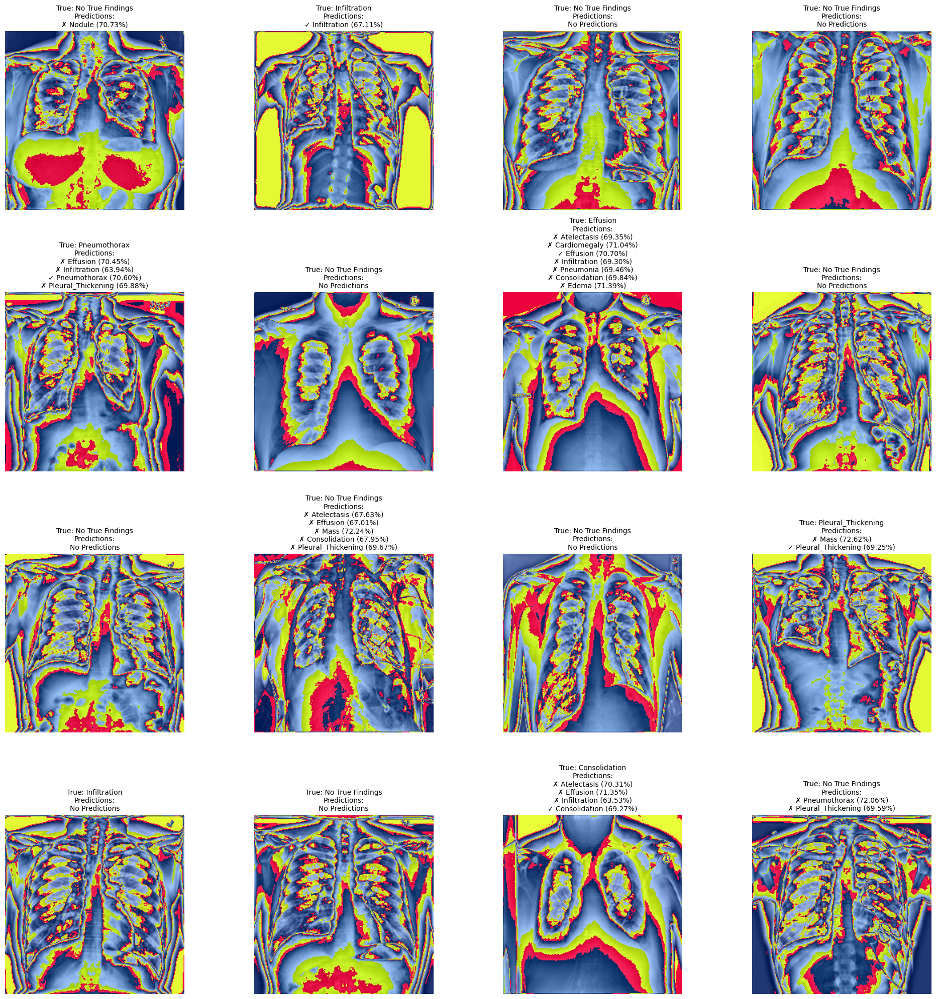

In [95]:
# Assuming you have the dataset, predictions, thresholds, and class names ready
display_random_images_with_true_and_predicted_findings(
    dataset=test_dataset,
    pred_global=pred_global,
    class_names=CLASS_NAMES,
    thresholds=best_thresholds,
    n_images=16
)


In [104]:
def display_best_and_worst_predictions(
    dataset, pred_global, class_names, thresholds, n_best=12, n_worst=4
):
    """
    Display the best and worst predictions with true findings and predictions, excluding "No True Findings."
    Args:
        dataset: Dataset containing images and labels.
        pred_global: Predictions for the dataset (e.g., output probabilities).
        class_names: List of class names.
        thresholds: List of thresholds for each class.
        n_best: Number of best predictions to display.
        n_worst: Number of worst predictions to display.
    """
    import matplotlib.pyplot as plt
    from torchvision.transforms import ToPILImage
    import numpy as np

    # Filter out images with "No True Findings"
    valid_indices = [
        idx for idx, (_, label) in enumerate(dataset)
        if any(label[i] == 1 for i in range(len(class_names)))
    ]

    # Compute prediction scores for valid images
    prediction_scores = []
    for idx in valid_indices:
        predictions = pred_global[idx].cpu().numpy()
        max_prediction = np.max(predictions)  # Get the highest prediction score
        prediction_scores.append((idx, max_prediction))

    # Sort by prediction scores
    prediction_scores.sort(key=lambda x: x[1], reverse=True)  # Sort descending

    # Get the best and worst indices
    best_indices = [x[0] for x in prediction_scores[:n_best]]
    worst_indices = [x[0] for x in prediction_scores[-n_worst:]]

    # Combine best and worst indices
    combined_indices = best_indices + worst_indices
    sections = ["Best"] * n_best + ["Worst"] * n_worst

    # Create subplots
    n_images = n_best + n_worst
    fig, axes = plt.subplots((n_images + 3) // 4, 4, figsize=(20, 5 * ((n_images + 3) // 4)))
    axes = axes.flatten()

    for idx, section, ax in zip(combined_indices, sections, axes):
        # Get the image and ground truth label
        image, label = dataset[idx]

        # Convert the image to grayscale (if not already)
        pil_image = ToPILImage()(image).convert("L")  # Convert to grayscale

        # Get the predictions for this image
        predictions = pred_global[idx].cpu().numpy()

        # Filter predictions using thresholds
        positive_predictions = [
            (class_names[i], predictions[i], label[i] == 1)
            for i in range(len(class_names))
            if predictions[i] > thresholds[i]
        ]

        # Format predictions with color coding
        predictions_text = "\n".join(
            [
                f"{'✓' if is_correct else '✗'} {class_name} ({probability:.2%})"
                for class_name, probability, is_correct in positive_predictions
            ]
        ) if positive_predictions else "No Predictions"

        # Get the true findings (ground truth)
        true_findings = [
            class_names[i]
            for i in range(len(class_names))
            if label[i] == 1  # Ground truth label is positive
        ]
        true_findings_text = ", ".join(true_findings) if true_findings else "No True Findings"

        # Display the grayscale image with true findings and predictions
        ax.imshow(pil_image, cmap="gray")  # Display in grayscale
        ax.set_title(
            f"{section}\nTrue: {true_findings_text}\nPred:\n{predictions_text}",
            fontsize=10,
            color="black",
        )
        ax.axis("off")

    # Turn off unused axes
    for ax in axes[len(combined_indices):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


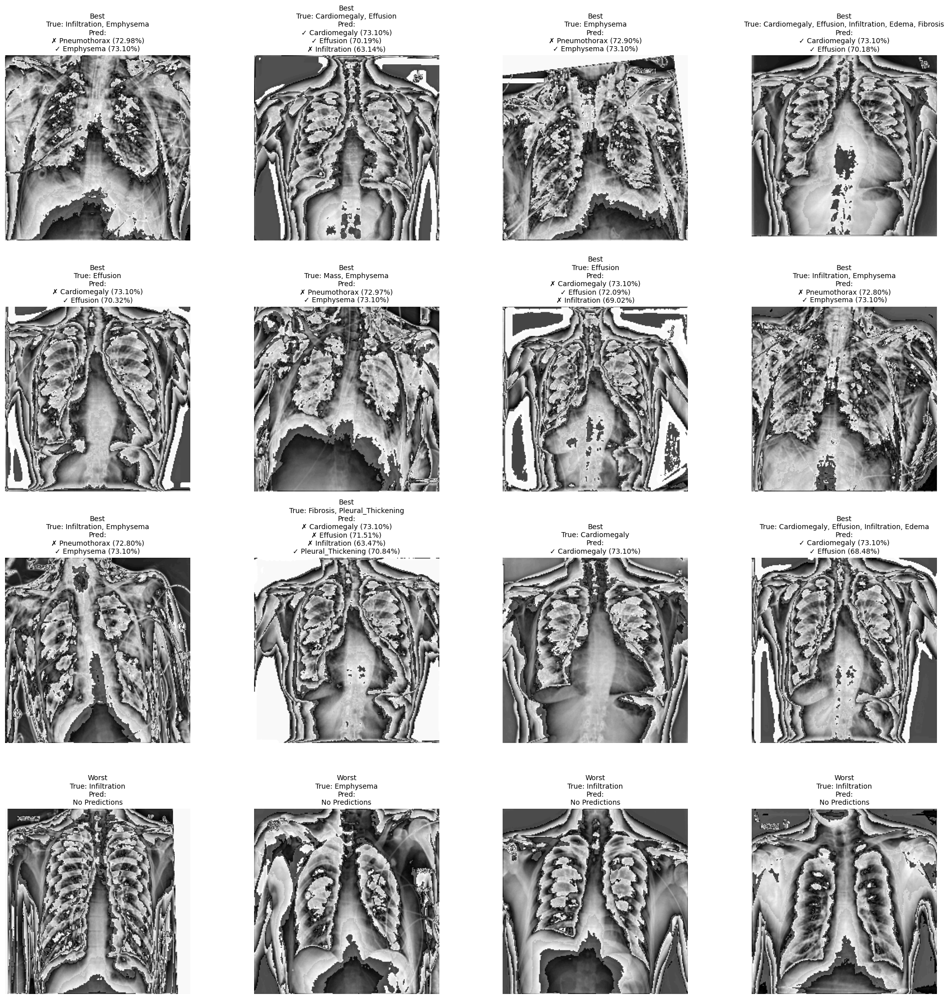

In [106]:
display_best_and_worst_predictions(
    dataset=test_dataset,
    pred_global=pred_global,
    class_names=CLASS_NAMES,
    thresholds=best_thresholds,
    n_best=12,  # Display 12 best predictions (including spot-on)
    n_worst=4   # Display 4 worst predictions
)
